In [ ]:
!pip install tensorboard

In [ ]:
import os
import json
from zipfile import ZipFile
from PIL import Image

# Load Kaggle credentials
kaggle_credentials = json.load(open("kaggle.json"))

# Set Kaggle API key as environment variable
os.environ['KAGGLE_USERNAME'] = kaggle_credentials["username"]
os.environ['KAGGLE_KEY'] = kaggle_credentials["key"]

# Download and unzip the CelebA dataset
! kaggle datasets download jessicali9530/celeba-dataset
! unzip /content/celeba-dataset.zip


Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
celeba-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/celeba-dataset.zip
replace img_align_celeba/img_align_celeba/000001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
# Imports for usage in training
import os
import numpy as np
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers

# Image shape is pixel size (64, 64, 3)
DATA_DIR = "/content/img_align_celeba/img_align_celeba"
IMG_SHAPE = (64, 64, 3)
NUM_IMAGES = 10000
BATCH_SIZE = 32

def load_and_preprocess_image(image_path, target_size=(64, 64)):
    """Load and preprocess an image."""
    image = Image.open(image_path).convert('RGB')  # Open the image and convert it to RGB format
    image = image.resize(target_size, Image.LANCZOS)  # Resize the image to the target size using Lanczos resampling
    image_array = np.asarray(image, dtype=np.float32)  # Convert the image to a numpy array of type float32
    image_array = (image_array - 127.5) / 127.5  # Normalize pixel values to the range [-1, 1]
    return image_array

def load_images(data_dir, num_images, img_shape):
    """Load a specified number of images from the directory."""
    image_files = os.listdir(data_dir)  # List all files in the directory
    np.random.shuffle(image_files)  # Shuffle the list to ensure randomness
    selected_files = image_files[:num_images]  # Select the first `num_images` files from the shuffled list
    images = []  # Initialize an empty list to store the loaded images
    for file_name in selected_files:
        file_path = os.path.join(data_dir, file_name)  # Construct the full file path
        if os.path.isfile(file_path):
            image = load_and_preprocess_image(file_path, img_shape[:2])  # Load and preprocess the image
            images.append(image)  # Append the preprocessed image to the list
    return np.array(images)  # Convert the list of images to a numpy array and return

# Load and preprocess images
images = load_images(DATA_DIR, NUM_IMAGES, IMG_SHAPE)
print(f"Loaded {images.shape[0]} images of shape {images.shape[1:]}.")


Loaded 10000 images of shape (64, 64, 3).


In [ ]:
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Reshape((8, 8, 256)))

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

# Build and summarize the generator model
generator = build_generator()
generator.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 16384)             1638400   
                                                                 
 batch_normalization_12 (Ba  (None, 16384)             65536     
 tchNormalization)                                               
                                                                 
 leaky_re_lu_20 (LeakyReLU)  (None, 16384)             0         
                                                                 
 reshape_4 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_12 (Conv2  (None, 16, 16, 128)       819200    
 DTranspose)                                                     
                                                                 
 batch_normalization_13 (Ba  (None, 16, 16, 128)      

In [ ]:
def build_discriminator():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=IMG_SHAPE))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# Build and summarize the discriminator model
discriminator = build_discriminator()
discriminator.summary()


Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 32, 32, 64)        4864      
                                                                 
 leaky_re_lu_23 (LeakyReLU)  (None, 32, 32, 64)        0         
                                                                 
 dropout_8 (Dropout)         (None, 32, 32, 64)        0         
                                                                 
 conv2d_9 (Conv2D)           (None, 16, 16, 128)       204928    
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 16, 16, 128)       0         
                                                                 
 dropout_9 (Dropout)         (None, 16, 16, 128)       0         
                                                                 
 flatten_4 (Flatten)         (None, 32768)            

In [ ]:
# Define the loss and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

import matplotlib.pyplot as plt
import time

# Lists to store generator and discriminator losses
gen_loss = []
disc_loss = []

# Dimensionality of the noise vector (latent space)
noise_dim = 100

# Training step function
@tf.function
def train_step(real_images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # Calculate generator loss
        gen_loss_value = cross_entropy(tf.ones_like(fake_output), fake_output)
        # Calculate discriminator loss
        disc_loss_value = cross_entropy(tf.ones_like(real_output), real_output) + \
                          cross_entropy(tf.zeros_like(fake_output), fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss_value, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss_value, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss_value, disc_loss_value


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5818: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


--------------------------------------------------
Epoch 1, Generator Loss: 2.466280937194824, Discriminator Loss: 2.1369504928588867
Time for epoch 1 is 12.920266151428223 sec
--------------------------------------------------
Epoch 2, Generator Loss: 1.5909706354141235, Discriminator Loss: 0.8036913871765137
Time for epoch 2 is 7.9009153842926025 sec


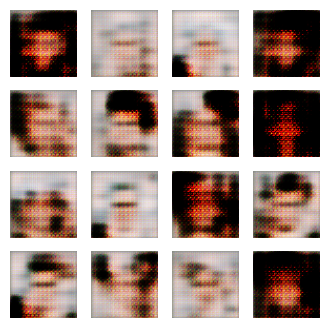

--------------------------------------------------
Epoch 3, Generator Loss: 1.6839351654052734, Discriminator Loss: 0.8831084966659546
Time for epoch 3 is 7.893402814865112 sec
--------------------------------------------------
Epoch 4, Generator Loss: 1.271503210067749, Discriminator Loss: 0.648619532585144
Time for epoch 4 is 7.909453868865967 sec


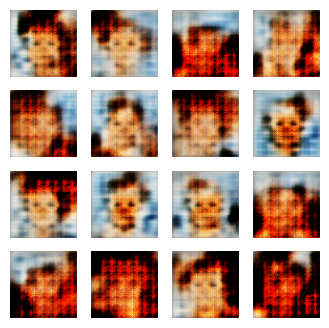

--------------------------------------------------
Epoch 5, Generator Loss: 1.1018433570861816, Discriminator Loss: 0.8712038993835449
Time for epoch 5 is 8.024901390075684 sec
--------------------------------------------------
Epoch 6, Generator Loss: 1.3834896087646484, Discriminator Loss: 1.103516697883606
Time for epoch 6 is 7.91016149520874 sec


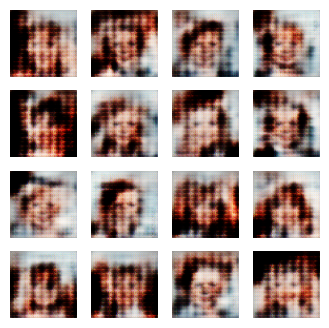

--------------------------------------------------
Epoch 7, Generator Loss: 1.0595734119415283, Discriminator Loss: 1.0136549472808838
Time for epoch 7 is 8.107335567474365 sec
--------------------------------------------------
Epoch 8, Generator Loss: 1.3529309034347534, Discriminator Loss: 0.9017573595046997
Time for epoch 8 is 10.225735187530518 sec


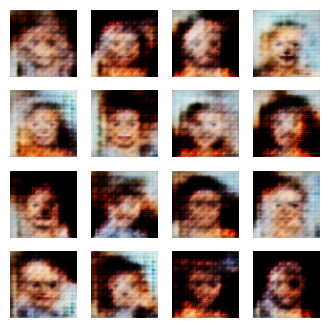

--------------------------------------------------
Epoch 9, Generator Loss: 1.7630105018615723, Discriminator Loss: 0.7644813060760498
Time for epoch 9 is 10.234280109405518 sec
--------------------------------------------------
Epoch 10, Generator Loss: 2.3748621940612793, Discriminator Loss: 0.6419224143028259
Time for epoch 10 is 8.117804765701294 sec


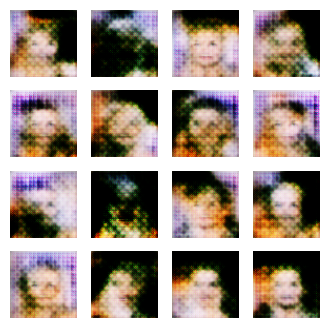

--------------------------------------------------
Epoch 11, Generator Loss: 1.4902629852294922, Discriminator Loss: 0.8219491243362427
Time for epoch 11 is 10.23206114768982 sec
--------------------------------------------------
Epoch 12, Generator Loss: 1.2686922550201416, Discriminator Loss: 1.2243691682815552
Time for epoch 12 is 8.232142686843872 sec


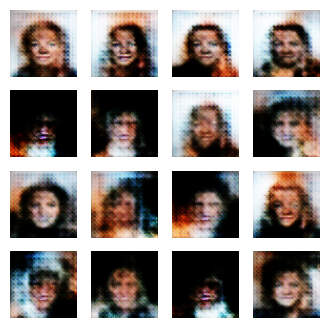

--------------------------------------------------
Epoch 13, Generator Loss: 1.6127500534057617, Discriminator Loss: 1.2067817449569702
Time for epoch 13 is 10.226787567138672 sec
--------------------------------------------------
Epoch 14, Generator Loss: 1.2275521755218506, Discriminator Loss: 0.9852308034896851
Time for epoch 14 is 8.291834831237793 sec


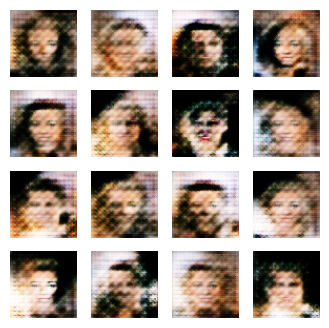

--------------------------------------------------
Epoch 15, Generator Loss: 1.474450707435608, Discriminator Loss: 0.5445866584777832
Time for epoch 15 is 10.23012375831604 sec
--------------------------------------------------
Epoch 16, Generator Loss: 1.2179821729660034, Discriminator Loss: 0.7098188400268555
Time for epoch 16 is 8.212475538253784 sec


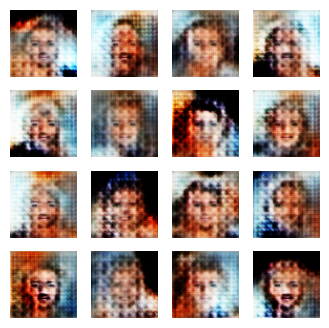

--------------------------------------------------
Epoch 17, Generator Loss: 1.202096700668335, Discriminator Loss: 0.7999622821807861
Time for epoch 17 is 10.223698139190674 sec
--------------------------------------------------
Epoch 18, Generator Loss: 1.6663997173309326, Discriminator Loss: 0.9011650085449219
Time for epoch 18 is 8.247512340545654 sec


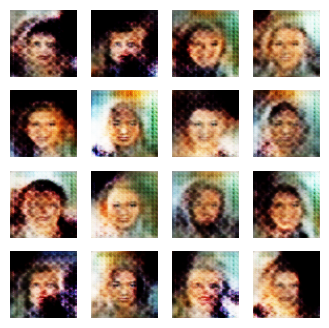

--------------------------------------------------
Epoch 19, Generator Loss: 1.2575719356536865, Discriminator Loss: 1.0337419509887695
Time for epoch 19 is 10.229073524475098 sec
--------------------------------------------------
Epoch 20, Generator Loss: 1.3338091373443604, Discriminator Loss: 1.0019487142562866
Time for epoch 20 is 8.183505058288574 sec


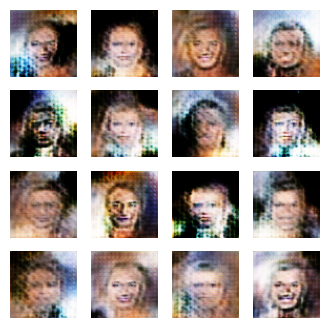

--------------------------------------------------
Epoch 21, Generator Loss: 1.1168544292449951, Discriminator Loss: 0.8480715155601501
Time for epoch 21 is 8.237759828567505 sec
--------------------------------------------------
Epoch 22, Generator Loss: 1.706390380859375, Discriminator Loss: 0.8010457754135132
Time for epoch 22 is 10.22481656074524 sec


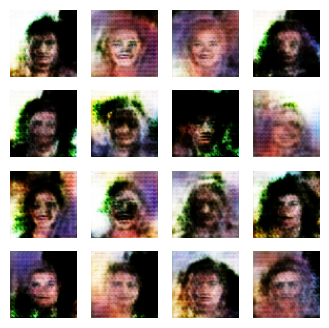

--------------------------------------------------
Epoch 23, Generator Loss: 1.3181430101394653, Discriminator Loss: 0.9058133959770203
Time for epoch 23 is 10.235896110534668 sec
--------------------------------------------------
Epoch 24, Generator Loss: 1.4533722400665283, Discriminator Loss: 0.7980795502662659
Time for epoch 24 is 8.18184232711792 sec


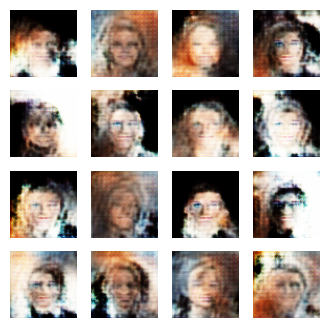

--------------------------------------------------
Epoch 25, Generator Loss: 0.7438575625419617, Discriminator Loss: 1.5007200241088867
Time for epoch 25 is 8.202980518341064 sec
--------------------------------------------------
Epoch 26, Generator Loss: 1.8799796104431152, Discriminator Loss: 0.6019134521484375
Time for epoch 26 is 10.223771810531616 sec


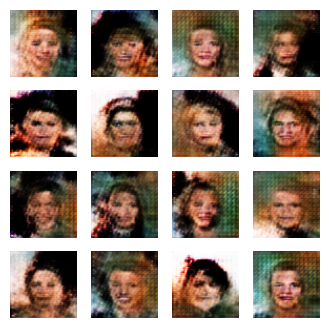

--------------------------------------------------
Epoch 27, Generator Loss: 1.1039165258407593, Discriminator Loss: 0.7865859270095825
Time for epoch 27 is 8.200563669204712 sec
--------------------------------------------------
Epoch 28, Generator Loss: 2.1530890464782715, Discriminator Loss: 0.5671310424804688
Time for epoch 28 is 8.22524118423462 sec


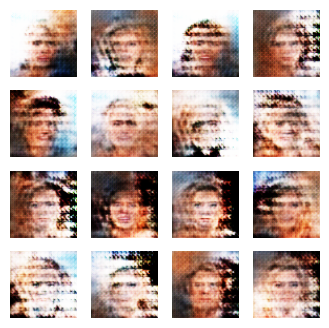

--------------------------------------------------
Epoch 29, Generator Loss: 1.515122890472412, Discriminator Loss: 1.2280995845794678
Time for epoch 29 is 10.223336935043335 sec
--------------------------------------------------
Epoch 30, Generator Loss: 0.844658613204956, Discriminator Loss: 1.054610252380371
Time for epoch 30 is 8.205722093582153 sec


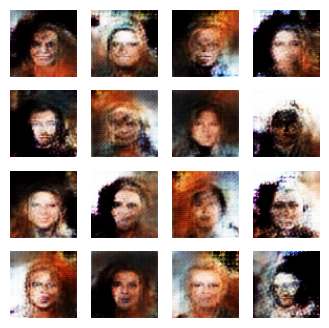

--------------------------------------------------
Epoch 31, Generator Loss: 1.7778583765029907, Discriminator Loss: 0.49092897772789
Time for epoch 31 is 10.224525451660156 sec
--------------------------------------------------
Epoch 32, Generator Loss: 2.903507709503174, Discriminator Loss: 1.8509786128997803
Time for epoch 32 is 8.315876960754395 sec


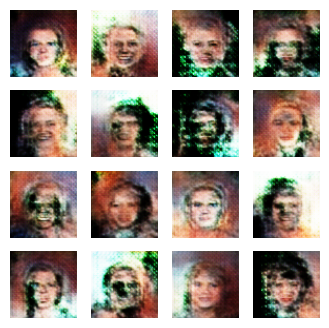

--------------------------------------------------
Epoch 33, Generator Loss: 1.588249683380127, Discriminator Loss: 0.925784707069397
Time for epoch 33 is 10.232235670089722 sec
--------------------------------------------------
Epoch 34, Generator Loss: 1.5490041971206665, Discriminator Loss: 0.7137104272842407
Time for epoch 34 is 8.176792621612549 sec


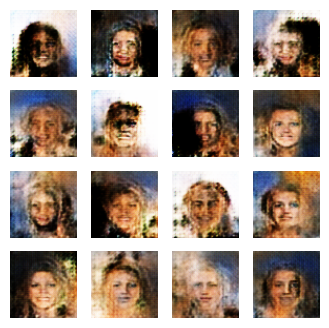

--------------------------------------------------
Epoch 35, Generator Loss: 1.5168362855911255, Discriminator Loss: 0.810897171497345
Time for epoch 35 is 8.258605003356934 sec
--------------------------------------------------
Epoch 36, Generator Loss: 2.011054515838623, Discriminator Loss: 1.0035138130187988
Time for epoch 36 is 10.224098205566406 sec


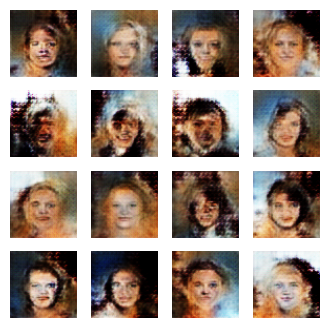

--------------------------------------------------
Epoch 37, Generator Loss: 2.201111316680908, Discriminator Loss: 0.5624167919158936
Time for epoch 37 is 10.229150295257568 sec
--------------------------------------------------
Epoch 38, Generator Loss: 1.6934378147125244, Discriminator Loss: 0.6083139181137085
Time for epoch 38 is 8.22587275505066 sec


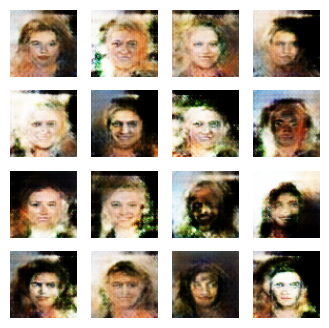

--------------------------------------------------
Epoch 39, Generator Loss: 1.8917630910873413, Discriminator Loss: 0.7363027334213257
Time for epoch 39 is 8.285560846328735 sec
--------------------------------------------------
Epoch 40, Generator Loss: 1.6083766222000122, Discriminator Loss: 0.6060258746147156
Time for epoch 40 is 10.222882270812988 sec


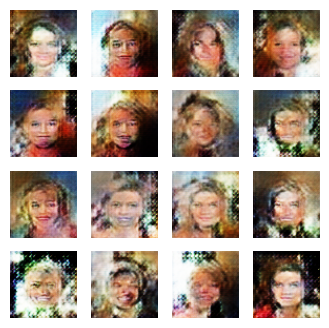

--------------------------------------------------
Epoch 41, Generator Loss: 1.2075166702270508, Discriminator Loss: 1.021897554397583
Time for epoch 41 is 8.23112678527832 sec
--------------------------------------------------
Epoch 42, Generator Loss: 1.9193096160888672, Discriminator Loss: 0.8991026878356934
Time for epoch 42 is 8.23661470413208 sec


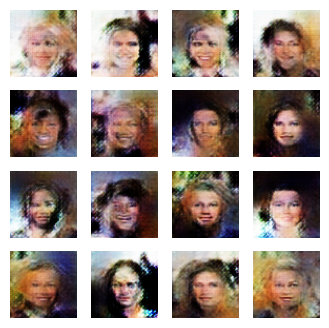

--------------------------------------------------
Epoch 43, Generator Loss: 1.8649897575378418, Discriminator Loss: 0.8565230369567871
Time for epoch 43 is 10.221975803375244 sec
--------------------------------------------------
Epoch 44, Generator Loss: 1.1701817512512207, Discriminator Loss: 1.519860029220581
Time for epoch 44 is 10.22397255897522 sec


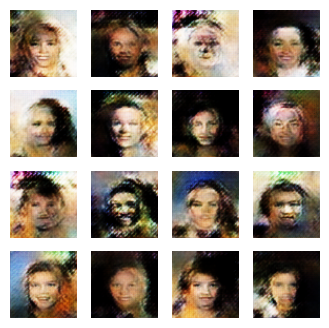

--------------------------------------------------
Epoch 45, Generator Loss: 1.7434289455413818, Discriminator Loss: 1.0225497484207153
Time for epoch 45 is 8.16363263130188 sec
--------------------------------------------------
Epoch 46, Generator Loss: 1.0502980947494507, Discriminator Loss: 1.5238611698150635
Time for epoch 46 is 8.185037851333618 sec


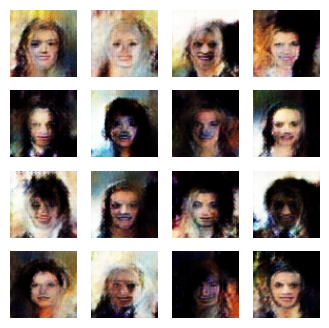

--------------------------------------------------
Epoch 47, Generator Loss: 1.153398871421814, Discriminator Loss: 0.8358731865882874
Time for epoch 47 is 8.240858793258667 sec
--------------------------------------------------
Epoch 48, Generator Loss: 1.2486848831176758, Discriminator Loss: 0.907813549041748
Time for epoch 48 is 8.31082820892334 sec


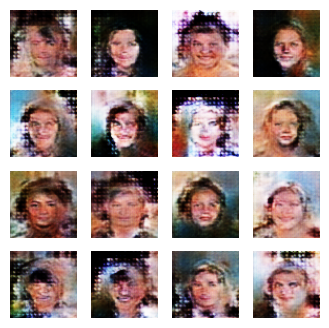

--------------------------------------------------
Epoch 49, Generator Loss: 1.5517268180847168, Discriminator Loss: 0.6590179204940796
Time for epoch 49 is 8.222042560577393 sec
--------------------------------------------------
Epoch 50, Generator Loss: 1.2643073797225952, Discriminator Loss: 0.9516169428825378
Time for epoch 50 is 8.095109224319458 sec


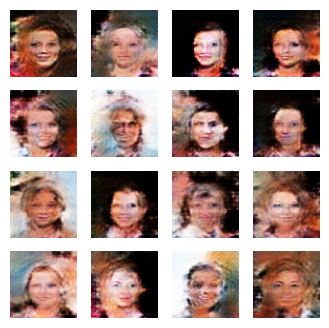

--------------------------------------------------
Epoch 51, Generator Loss: 0.9625828266143799, Discriminator Loss: 1.1110222339630127
Time for epoch 51 is 8.185457706451416 sec
--------------------------------------------------
Epoch 52, Generator Loss: 2.2168359756469727, Discriminator Loss: 0.894905686378479
Time for epoch 52 is 10.223208904266357 sec


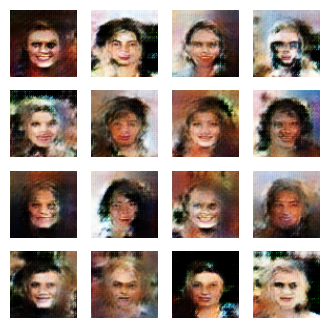

--------------------------------------------------
Epoch 53, Generator Loss: 1.511617660522461, Discriminator Loss: 1.0700931549072266
Time for epoch 53 is 10.225417375564575 sec
--------------------------------------------------
Epoch 54, Generator Loss: 1.33457350730896, Discriminator Loss: 0.6833645105361938
Time for epoch 54 is 8.125360250473022 sec


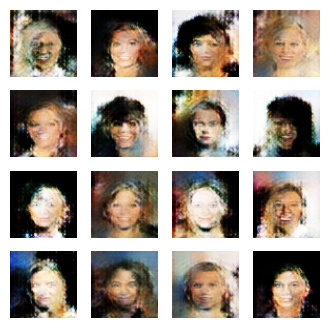

--------------------------------------------------
Epoch 55, Generator Loss: 2.2821381092071533, Discriminator Loss: 0.7870733737945557
Time for epoch 55 is 8.202632904052734 sec
--------------------------------------------------
Epoch 56, Generator Loss: 1.0882718563079834, Discriminator Loss: 1.043109655380249
Time for epoch 56 is 10.2237708568573 sec


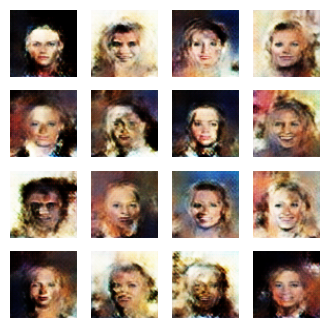

--------------------------------------------------
Epoch 57, Generator Loss: 1.232593297958374, Discriminator Loss: 1.0381571054458618
Time for epoch 57 is 10.228371858596802 sec
--------------------------------------------------
Epoch 58, Generator Loss: 1.3508727550506592, Discriminator Loss: 1.0474660396575928
Time for epoch 58 is 8.138360977172852 sec


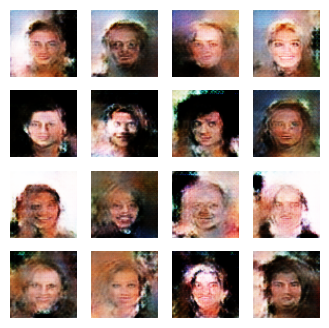

--------------------------------------------------
Epoch 59, Generator Loss: 1.319922685623169, Discriminator Loss: 0.8896418809890747
Time for epoch 59 is 8.201380729675293 sec
--------------------------------------------------
Epoch 60, Generator Loss: 1.82955801486969, Discriminator Loss: 0.5507602095603943
Time for epoch 60 is 10.223402976989746 sec


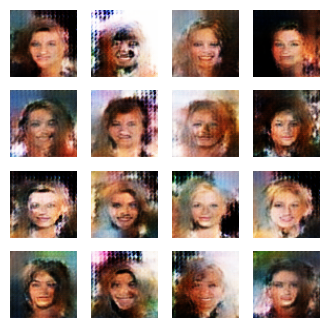

--------------------------------------------------
Epoch 61, Generator Loss: 1.242983102798462, Discriminator Loss: 0.6954568028450012
Time for epoch 61 is 8.193041801452637 sec
--------------------------------------------------
Epoch 62, Generator Loss: 1.6518447399139404, Discriminator Loss: 0.6068499684333801
Time for epoch 62 is 8.170661449432373 sec


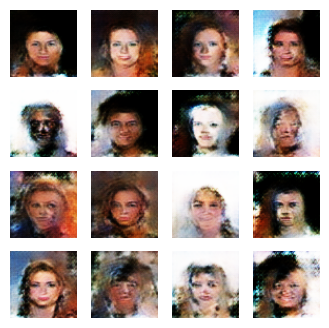

--------------------------------------------------
Epoch 63, Generator Loss: 1.1422314643859863, Discriminator Loss: 0.9180020093917847
Time for epoch 63 is 8.165118932723999 sec
--------------------------------------------------
Epoch 64, Generator Loss: 2.0677804946899414, Discriminator Loss: 0.8511042594909668
Time for epoch 64 is 8.177677154541016 sec


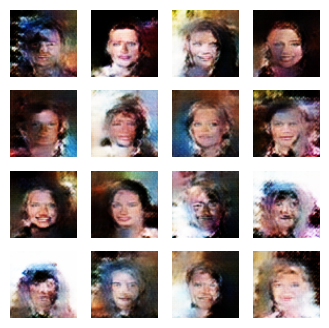

--------------------------------------------------
Epoch 65, Generator Loss: 2.0824341773986816, Discriminator Loss: 0.770334005355835
Time for epoch 65 is 8.169849634170532 sec
--------------------------------------------------
Epoch 66, Generator Loss: 1.932704210281372, Discriminator Loss: 0.5034434199333191
Time for epoch 66 is 10.223804473876953 sec


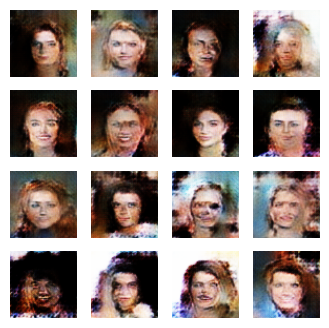

--------------------------------------------------
Epoch 67, Generator Loss: 1.6927094459533691, Discriminator Loss: 0.958114743232727
Time for epoch 67 is 10.23274564743042 sec
--------------------------------------------------
Epoch 68, Generator Loss: 1.908219814300537, Discriminator Loss: 0.6179714202880859
Time for epoch 68 is 8.151302576065063 sec


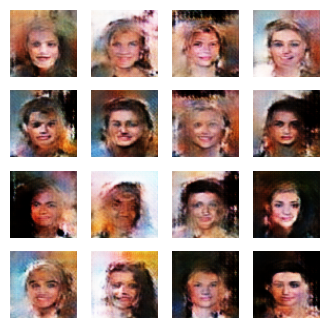

--------------------------------------------------
Epoch 69, Generator Loss: 1.9146924018859863, Discriminator Loss: 0.4212135374546051
Time for epoch 69 is 8.194715738296509 sec
--------------------------------------------------
Epoch 70, Generator Loss: 1.2434957027435303, Discriminator Loss: 0.962809681892395
Time for epoch 70 is 8.14685583114624 sec


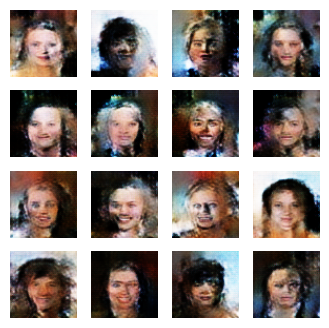

--------------------------------------------------
Epoch 71, Generator Loss: 1.5685491561889648, Discriminator Loss: 1.037419319152832
Time for epoch 71 is 10.223281621932983 sec
--------------------------------------------------
Epoch 72, Generator Loss: 1.9948649406433105, Discriminator Loss: 0.5500792264938354
Time for epoch 72 is 10.224270820617676 sec


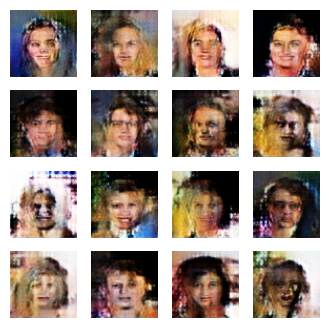

--------------------------------------------------
Epoch 73, Generator Loss: 1.6548337936401367, Discriminator Loss: 0.6712121963500977
Time for epoch 73 is 8.243555307388306 sec
--------------------------------------------------
Epoch 74, Generator Loss: 1.8284180164337158, Discriminator Loss: 0.8714712858200073
Time for epoch 74 is 8.073596000671387 sec


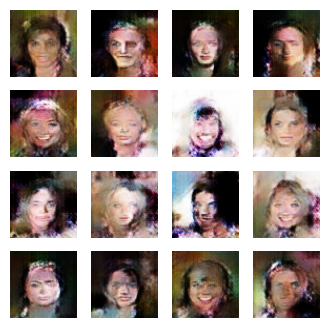

--------------------------------------------------
Epoch 75, Generator Loss: 1.2354369163513184, Discriminator Loss: 0.8266885280609131
Time for epoch 75 is 8.19144344329834 sec
--------------------------------------------------
Epoch 76, Generator Loss: 1.9952529668807983, Discriminator Loss: 0.770012617111206
Time for epoch 76 is 10.22412371635437 sec


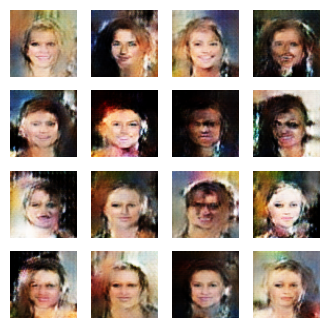

--------------------------------------------------
Epoch 77, Generator Loss: 1.2656632661819458, Discriminator Loss: 0.8462303876876831
Time for epoch 77 is 10.234560489654541 sec
--------------------------------------------------
Epoch 78, Generator Loss: 1.4457006454467773, Discriminator Loss: 0.6252865791320801
Time for epoch 78 is 8.1324462890625 sec


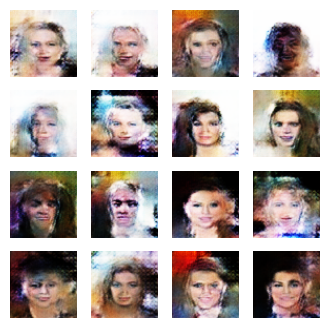

--------------------------------------------------
Epoch 79, Generator Loss: 1.7975313663482666, Discriminator Loss: 0.5927561521530151
Time for epoch 79 is 8.192458391189575 sec
--------------------------------------------------
Epoch 80, Generator Loss: 1.578643798828125, Discriminator Loss: 0.658855676651001
Time for epoch 80 is 10.225230693817139 sec


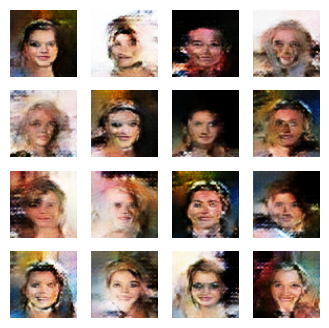

--------------------------------------------------
Epoch 81, Generator Loss: 1.880479097366333, Discriminator Loss: 0.7637907862663269
Time for epoch 81 is 8.174718618392944 sec
--------------------------------------------------
Epoch 82, Generator Loss: 1.9642714262008667, Discriminator Loss: 0.774034857749939
Time for epoch 82 is 8.189110040664673 sec


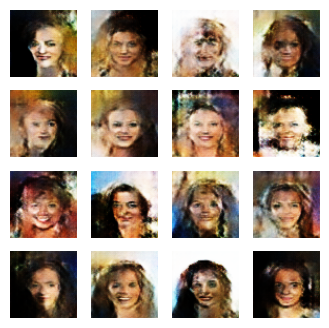

--------------------------------------------------
Epoch 83, Generator Loss: 2.5973081588745117, Discriminator Loss: 0.4354630410671234
Time for epoch 83 is 10.233802318572998 sec
--------------------------------------------------
Epoch 84, Generator Loss: 1.0326048135757446, Discriminator Loss: 1.1029539108276367
Time for epoch 84 is 8.151874542236328 sec


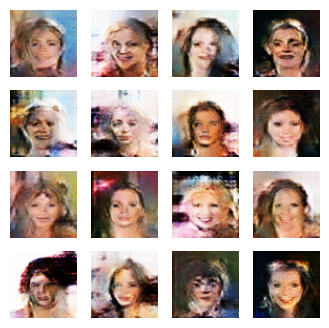

--------------------------------------------------
Epoch 85, Generator Loss: 2.425992965698242, Discriminator Loss: 0.9348875284194946
Time for epoch 85 is 8.17188024520874 sec
--------------------------------------------------
Epoch 86, Generator Loss: 1.796981930732727, Discriminator Loss: 0.8196946978569031
Time for epoch 86 is 10.223896741867065 sec


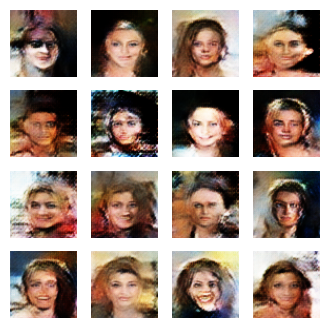

--------------------------------------------------
Epoch 87, Generator Loss: 1.240754246711731, Discriminator Loss: 0.918121337890625
Time for epoch 87 is 10.231379270553589 sec
--------------------------------------------------
Epoch 88, Generator Loss: 1.0478649139404297, Discriminator Loss: 0.9626845121383667
Time for epoch 88 is 8.147255659103394 sec


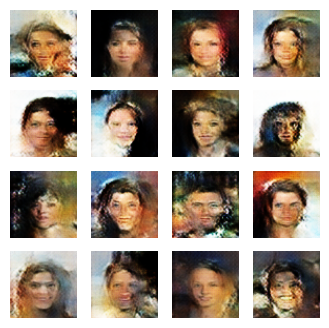

--------------------------------------------------
Epoch 89, Generator Loss: 1.4598782062530518, Discriminator Loss: 0.7916265726089478
Time for epoch 89 is 8.188669919967651 sec
--------------------------------------------------
Epoch 90, Generator Loss: 1.9272924661636353, Discriminator Loss: 0.774256706237793
Time for epoch 90 is 10.222568273544312 sec


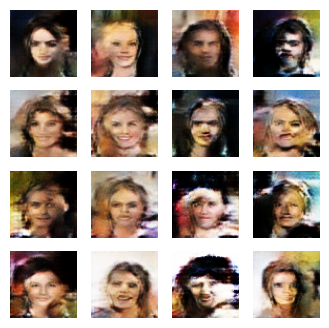

--------------------------------------------------
Epoch 91, Generator Loss: 2.2595536708831787, Discriminator Loss: 0.6933699250221252
Time for epoch 91 is 8.141021490097046 sec
--------------------------------------------------
Epoch 92, Generator Loss: 1.6823546886444092, Discriminator Loss: 1.1525107622146606
Time for epoch 92 is 8.182343482971191 sec


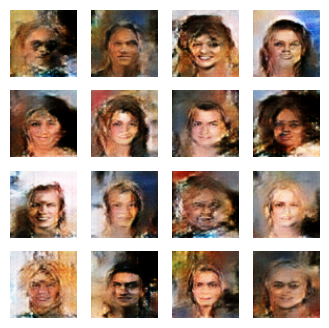

--------------------------------------------------
Epoch 93, Generator Loss: 1.7122976779937744, Discriminator Loss: 0.5661132335662842
Time for epoch 93 is 8.186164140701294 sec
--------------------------------------------------
Epoch 94, Generator Loss: 1.3751561641693115, Discriminator Loss: 1.0218968391418457
Time for epoch 94 is 8.101109743118286 sec


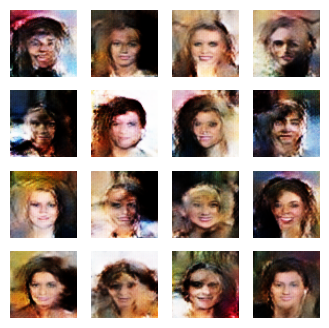

--------------------------------------------------
Epoch 95, Generator Loss: 1.5562907457351685, Discriminator Loss: 0.8241020441055298
Time for epoch 95 is 8.191492319107056 sec
--------------------------------------------------
Epoch 96, Generator Loss: 1.7271649837493896, Discriminator Loss: 0.6988721489906311
Time for epoch 96 is 8.144816875457764 sec


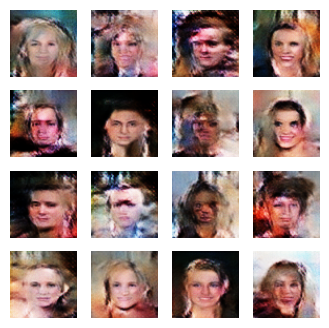

--------------------------------------------------
Epoch 97, Generator Loss: 1.7079033851623535, Discriminator Loss: 0.7760966420173645
Time for epoch 97 is 8.210650444030762 sec
--------------------------------------------------
Epoch 98, Generator Loss: 1.8531585931777954, Discriminator Loss: 0.9676505923271179
Time for epoch 98 is 8.142226457595825 sec


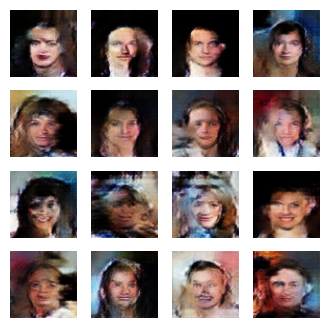

--------------------------------------------------
Epoch 99, Generator Loss: 1.798554539680481, Discriminator Loss: 0.6119351983070374
Time for epoch 99 is 10.228259086608887 sec
--------------------------------------------------
Epoch 100, Generator Loss: 1.5570943355560303, Discriminator Loss: 0.8086971044540405
Time for epoch 100 is 8.129005193710327 sec


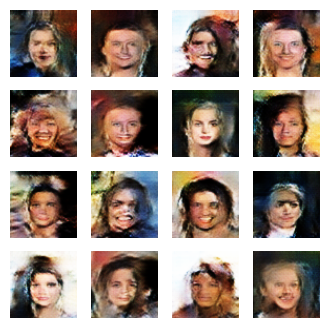

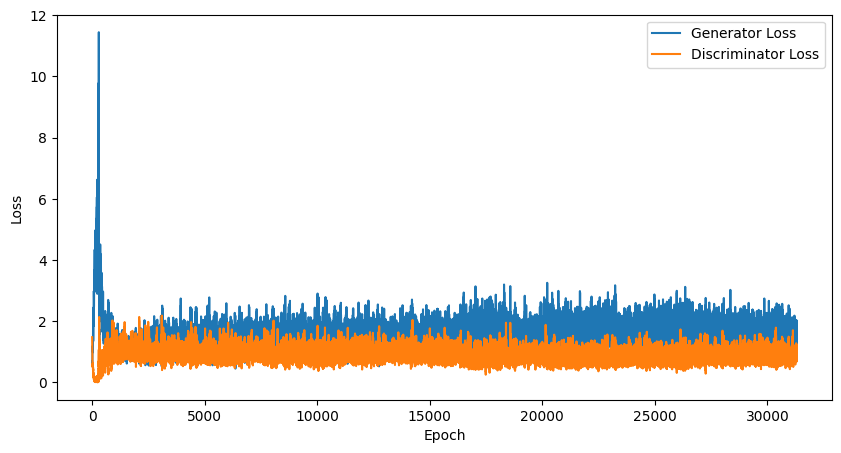

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import time
import datetime

# Assuming train_step, generator, and noise_dim are already defined
gen_loss = []
disc_loss = []

def generate_and_save_images(model, epoch, noise_dim):
    noise = tf.random.normal([16, noise_dim])
    predictions = model(noise, training=False)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype('uint8'))
        plt.axis('off')

    plt.show()

def train(dataset, epochs, log_dir='logs/'):
    # Initialize summary writers
    summary_writer = tf.summary.create_file_writer(log_dir)

    for epoch in range(epochs):
        start = time.time()

        for image_batch in dataset:
            gen_loss_value, disc_loss_value = train_step(image_batch)
            gen_loss.append(gen_loss_value.numpy())
            disc_loss.append(disc_loss_value.numpy())

            # Write loss values to TensorBoard
            with summary_writer.as_default():
                tf.summary.scalar('Generator Loss', gen_loss_value, step=epoch)
                tf.summary.scalar('Discriminator Loss', disc_loss_value, step=epoch)

        print('-' * 50)
        print(f'Epoch {epoch + 1}, Generator Loss: {gen_loss_value}, Discriminator Loss: {disc_loss_value}')
        print(f'Time for epoch {epoch + 1} is {time.time() - start} sec')

        if (epoch + 1) % 2 == 0:
            generate_and_save_images(generator, epoch + 1, noise_dim)

    # Plot the losses
    plt.figure(figsize=(10, 5))
    plt.plot(gen_loss, label='Generator Loss')
    plt.plot(disc_loss, label='Discriminator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Prepare dataset and train the GAN
with tf.device('/gpu:0'):
    train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(1000).batch(BATCH_SIZE)
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    train(train_dataset, epochs=50, log_dir=log_dir)

# Load the TensorBoard extension
%load_ext tensorboard

# Launch TensorBoard
%tensorboard --logdir logs/fit


In [ ]:
# import tensorflow as tf
# import matplotlib.pyplot as plt
# import time

# # Assuming train_step, generator, and noise_dim are already defined
# gen_loss = []
# disc_loss = []

# def generate_and_save_images(model, epoch, noise_dim):
#     noise = tf.random.normal([16, noise_dim])
#     predictions = model(noise, training=False)

#     fig = plt.figure(figsize=(4, 4))

#     for i in range(predictions.shape[0]):
#         plt.subplot(4, 4, i + 1)
#         plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype('uint8'))
#         plt.axis('off')

#     plt.show()

# def train(dataset, epochs, log_dir='logs/'):
#     # Initialize summary writers
#     summary_writer = tf.summary.create_file_writer(log_dir)

#     for epoch in range(epochs):
#         start = time.time()

#         for image_batch in dataset:
#             gen_loss_value, disc_loss_value = train_step(image_batch)
#             gen_loss.append(gen_loss_value.numpy())
#             disc_loss.append(disc_loss_value.numpy())

#             # Write loss values to TensorBoard
#             with summary_writer.as_default():
#                 tf.summary.scalar('Generator Loss', gen_loss_value, step=epoch)
#                 tf.summary.scalar('Discriminator Loss', disc_loss_value, step=epoch)

#         print('-' * 50)
#         print(f'Epoch {epoch + 1}, Generator Loss: {gen_loss_value}, Discriminator Loss: {disc_loss_value}')
#         print(f'Time for epoch {epoch + 1} is {time.time() - start} sec')

#         if (epoch + 1) % 2 == 0:
#             generate_and_save_images(generator, epoch + 1, noise_dim)

#     # Plot the losses
#     plt.figure(figsize=(10, 5))
#     plt.plot(gen_loss, label='Generator Loss')
#     plt.plot(disc_loss, label='Discriminator Loss')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.show()

# # Prepare dataset and train the GAN
# with tf.device('/gpu:0'):
#     train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(1000).batch(BATCH_SIZE)
#     train(train_dataset, epochs=50)


Key Metrics:
Generator Loss (G Loss):

Represents how well the generator is doing in creating realistic images.
Lower values indicate the generator is producing more realistic images.
Discriminator Loss (D Loss):

Represents how well the discriminator is distinguishing between real and fake images.
Lower values indicate the discriminator is more accurately identifying real vs. generated images.
Interpreting the Metrics:
Training Dynamics:

G Loss and D Loss Trends:
Initially, you may see high values for both losses. As training progresses, both should ideally decrease.
If G Loss is decreasing but D Loss is not, it might indicate that the generator is getting better at fooling the discriminator.
If D Loss is decreasing but G Loss is not, it might indicate that the discriminator is overpowering the generator, making it hard for the generator to learn.
Oscillations:

Moderate Oscillations: Some oscillation in loss values is normal and indicates the adversarial nature of GAN training.
Severe Oscillations: Large and frequent oscillations might indicate instability. Techniques like learning rate adjustments, adding regularization, or balancing training steps can help.
Convergence:

Ideally, you want both losses to stabilize at low values. This indicates that the generator produces realistic images that the discriminator struggles to differentiate from real ones.
If one loss converges much faster than the other, it could signal an imbalance. For example, if D Loss quickly goes to zero, it suggests the discriminator is too strong.
TensorBoard Visualizations:
Scalars Tab:

View the scalar plots for G Loss and D Loss over epochs.
Look for the trends and stability discussed above.
Histograms Tab:

If you log additional metrics like gradients, you can check how these distributions change over time.
Example TensorBoard Analysis:
Balanced Training:

Both G Loss and D Loss decrease over time and stabilize, indicating a balanced training process.
Moderate oscillations are present but within a reasonable range.
Generator Dominates:

G Loss decreases steadily, but D Loss remains high.
Indicates the generator is producing realistic images that the discriminator fails to distinguish.
Discriminator Dominates:

D Loss decreases steadily, but G Loss remains high or increases.
Indicates the discriminator is too strong, preventing the generator from improving.


In [ ]:
# def generate_and_save_images(model, epoch, noise_dim):
#     noise = tf.random.normal([16, noise_dim])
#     predictions = model(noise, training=False)

#     fig = plt.figure(figsize=(4, 4))

#     for i in range(predictions.shape[0]):
#         plt.subplot(4, 4, i + 1)
#         plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype('uint8'))
#         plt.axis('off')

#     plt.show()

# def train(dataset, epochs):
#     for epoch in range(epochs):
#         start = time.time()

#         for image_batch in dataset:
#             gen_loss_value, disc_loss_value = train_step(image_batch)
#             gen_loss.append(gen_loss_value.numpy())
#             disc_loss.append(disc_loss_value.numpy())

#         print('-' * 50)
#         print(f'Epoch {epoch + 1}, Generator Loss: {gen_loss_value}, Discriminator Loss: {disc_loss_value}')
#         print(f'Time for epoch {epoch + 1} is {time.time() - start} sec')

#         if (epoch + 1) % 2 == 0:
#             generate_and_save_images(generator, epoch + 1, noise_dim)

# # Prepare dataset and train the GAN
# with tf.device('/gpu:0'):
#     train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(1000).batch(BATCH_SIZE)
#     train(train_dataset, epochs=100)


1/1 [==============================] - 0s 255ms/step


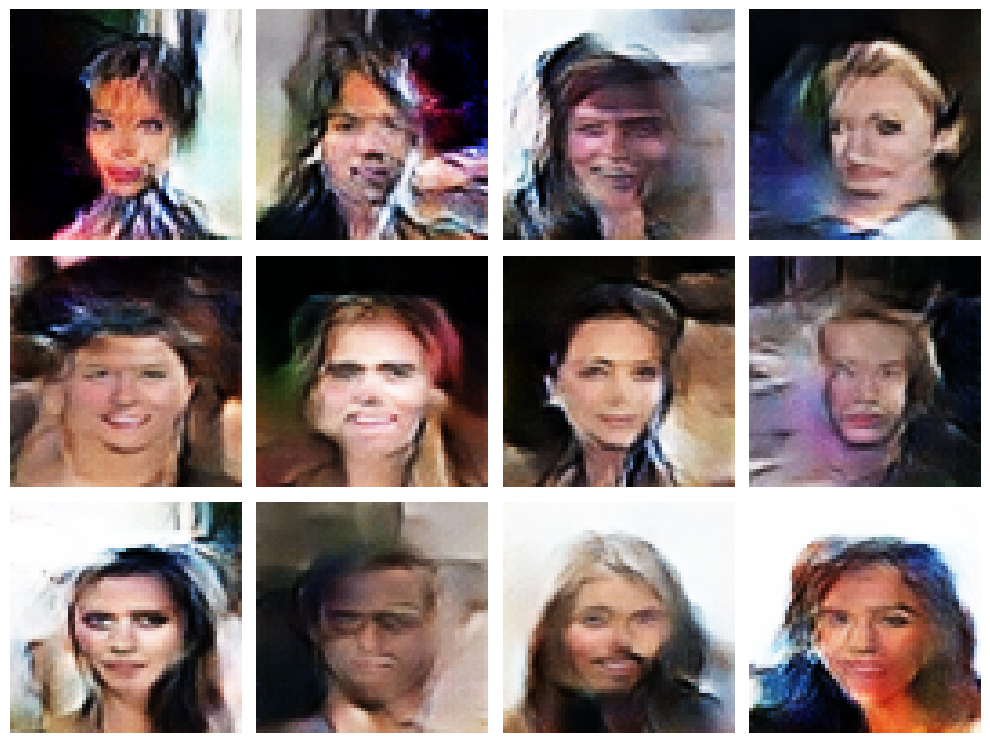

In [ ]:
from tensorflow.keras.models import load_model

# Replace 'your_model_path' with the actual path to your model
model_path = '/content/gan_celebal.h5'
generator = load_model(model_path)

import os

def save_model_weights(generator, discriminator, save_dir='/content/drive/MyDrive/gan_weights'):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    generator.save_weights(os.path.join(save_dir, 'generator_epoch.h5'))
    discriminator.save_weights(os.path.join(save_dir, 'discriminator_epoch.h5'))

# Save model weights
save_model_weights(generator, discriminator)

# Function to generate and plot fake images
def generate_and_plot_images(generator, noise_dim, num_images=16, figsize=(10, 10)):
    noise = np.random.normal(0, 1, size=(num_images, noise_dim))
    generated_images = generator.predict(noise)

    generated_images = 0.5 * generated_images + 0.5

    plt.figure(figsize=figsize)
    for i in range(num_images):
        plt.subplot(4, 4, i + 1)
        plt.imshow(generated_images[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage
noise_dim = 100
num_images_to_generate = 12
generate_and_plot_images(generator, noise_dim, num_images=num_images_to_generate)

generator.save('gan_celebal.h5')
generator.save_weights('gan_celebal_weights.h5')
generator.load_weights('/content/gan_celebal.h5')


In [ ]:
# def plot_losses(gen_loss, disc_loss):
#     """Plot the generator and discriminator losses."""
#     plt.figure(figsize=(10, 5))
#     plt.plot(gen_loss, label='Generator Loss')
#     plt.plot(disc_loss, label='Discriminator Loss')
#     plt.xlabel('Iterations')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.show()

# # Call plot_losses after training
# plot_losses(gen_loss, disc_loss)
